# ■rembgインストール

https://pypi.org/project/rembg/ <BR>
https://github.com/danielgatis/rembg <BR>

In [ ]:
!python --version

Python 3.7.10


In [1]:
!pip install -U pip

     |████████████████████████████████| 1.5MB 5.5MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1


In [2]:
!pip install torch==1.7.1+cpu torchvision==0.8.2+cpu -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
  Using cached https://download.pytorch.org/whl/cpu/torch-1.7.1%2Bcpu-cp37-cp37m-linux_x86_64.whl (159.4 MB)
  Using cached https://download.pytorch.org/whl/cpu/torchvision-0.8.2%2Bcpu-cp37-cp37m-linux_x86_64.whl (11.8 MB)
  Attempting uninstall: torch
    Found existing installation: torch 1.6.0
    Uninstalling torch-1.6.0:
      Successfully uninstalled torch-1.6.0
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.7.0
    Uninstalling torchvision-0.7.0:
      Successfully uninstalled torchvision-0.7.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.9.1 requires torch==1.8.1, but you have torch 1.7.1+cpu which is incompatible.
rembg 1.0.14 requires torch==1.6.0, but you have torch 1.7.1+cpu which is incompatible.
rembg 1.0.14 requires torchvision=

In [ ]:
!pip install rembg

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 68 kB 2.7 MB/s 
     |████████████████████████████████| 25.9 MB 11 kB/s 
     |████████████████████████████████| 12.5 MB 37.3 MB/s 
     |████████████████████████████████| 5.9 MB 50.4 MB/s 
     |████████████████████████████████| 58 kB 4.3 MB/s 
     |████████████████████████████████| 61 kB 359 kB/s 
     |████████████████████████████████| 40 kB 4.4 MB/s 
     |████████████████████████████████| 2.2 MB 47.7 MB/s 
     |████████████████████████████████| 14.5 MB 68.3 MB/s 
     |████████████████████████████████| 748.8 MB 14 kB/s 
  Created wheel for rembg: filename=rembg-1.0.14-py3-none-any.whl size=12386 sha256=313f6b3d0a1f4441602892ccce3a5c2c3cead6dad6803b65c1a5859d16fb95dc
  Stored in directory: /root/.cache/pip/wheels/a7/2c/55/866186a0a9541a8879151d1d0ca8f2b8e4182fda0fda2bf8bc
Successfully built rembg
  Attempting uninsta

# ■切り取り元画像のアップロード
以下1つの画像を「/content」にアップロードしてください。
* sample.png

きちんとアップロードできたか確認

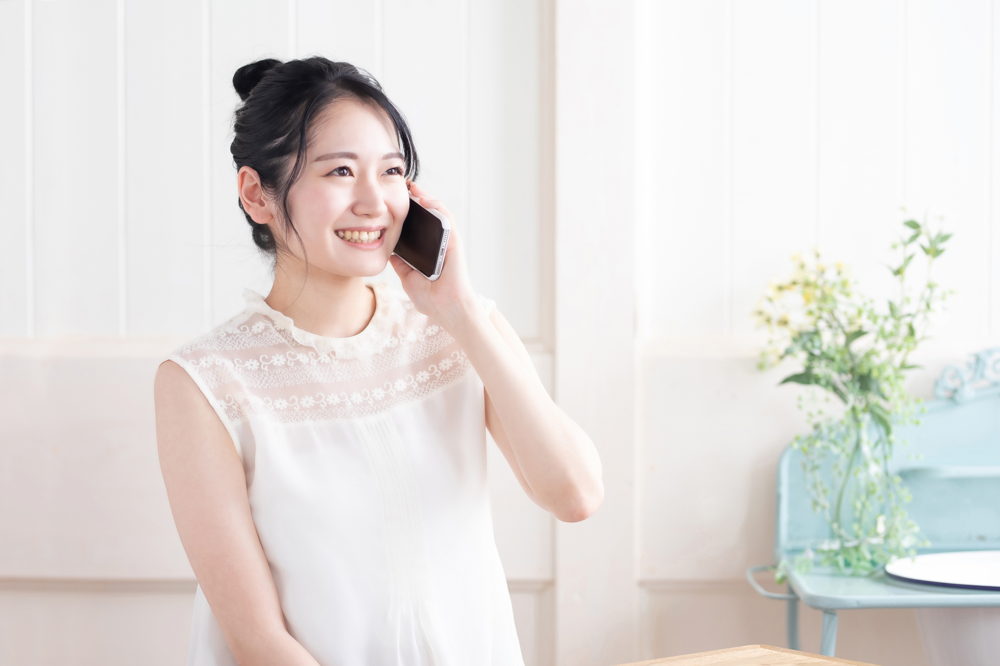

In [ ]:
from IPython.display import Image, display_png
display_png(Image('sample.png'))

# ■ rembg実行

とりあえず実行

In [ ]:
from rembg.bg import remove
import numpy as np
import io
from PIL import Image

input_path = 'sample.png'
output_path = 'cutout.png'

f = np.fromfile(input_path)
result = remove(f,
                alpha_matting=True,
                alpha_matting_foreground_threshold=240,
                alpha_matting_background_threshold=10,
                alpha_matting_erode_structure_size=6)
img = Image.open(io.BytesIO(result)).convert("RGBA")
img.save(output_path)

TypeError: ignored

# ■プログラム変更

/usr/local/lib/python3.7/dist-packages/rembg/bg.py <BR>

**■変更点1：エラーの対処 <BR>**
bg.py, line 67を以下の様に処理変更
```
@functools.lru_cache
     ↓↓↓↓
@functools.lru_cache(maxsize=None)
```

**■変更点2：Trimap画像の保存処理追加<BR>**
bg.py, line 85の後に以下3行処理追加
```
    output_path = '/content/trimap.png'
    mask = mask.resize(img.size)
    mask.save(output_path)
```

**※ファイルを修正したら「ランタイムを再起動」を実行してください**


# ■rembg実行

エラーを修正し再度rembgを実行

In [ ]:
from rembg.bg import remove
import numpy as np
import io
from PIL import Image

input_path = 'sample.png'
output_path = 'cutout.png'

f = np.fromfile(input_path)
result = remove(f,
                alpha_matting=True,
                alpha_matting_foreground_threshold=240,
                alpha_matting_background_threshold=10,
                alpha_matting_erode_structure_size=6)
img = Image.open(io.BytesIO(result)).convert("RGBA")
img.save(output_path)

# ■rembg実行結果表示

できたかな？

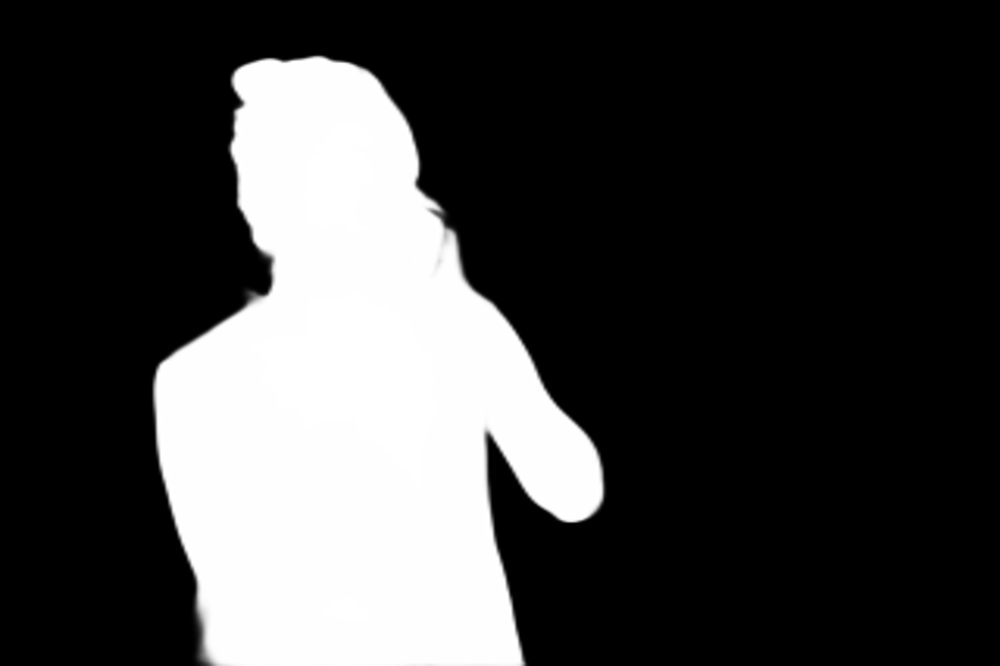

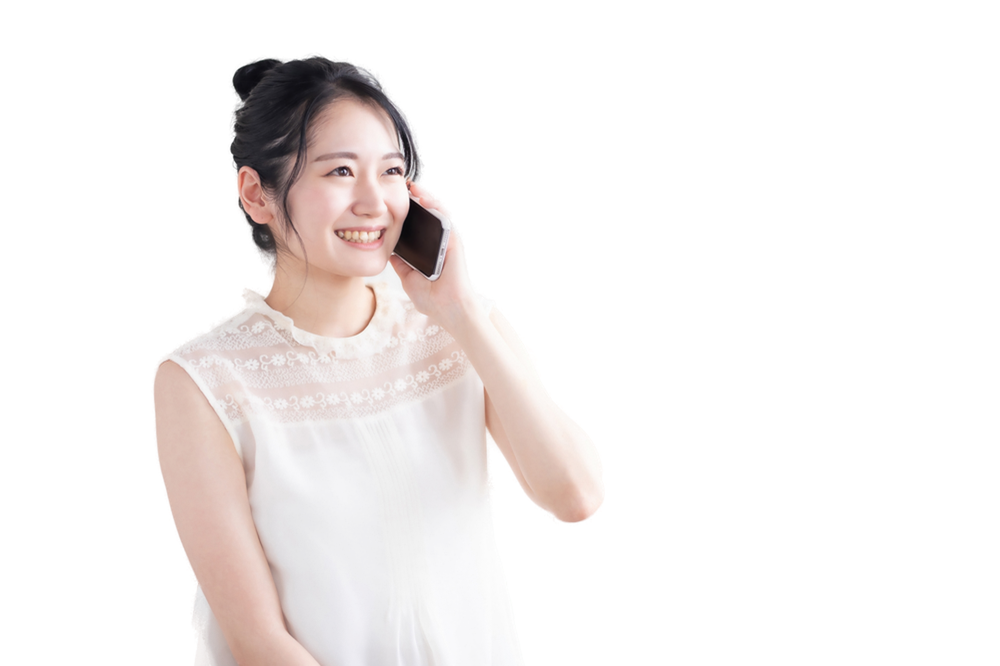

In [ ]:
from IPython.display import Image, display_png
display_png(Image('trimap.png'))
display_png(Image('cutout.png'))

# ■背景画像のアップロード
以下2つの画像を「/content」にアップロードしてください。
* background.png
* greenback.png

きちんとアップロードできたか確認

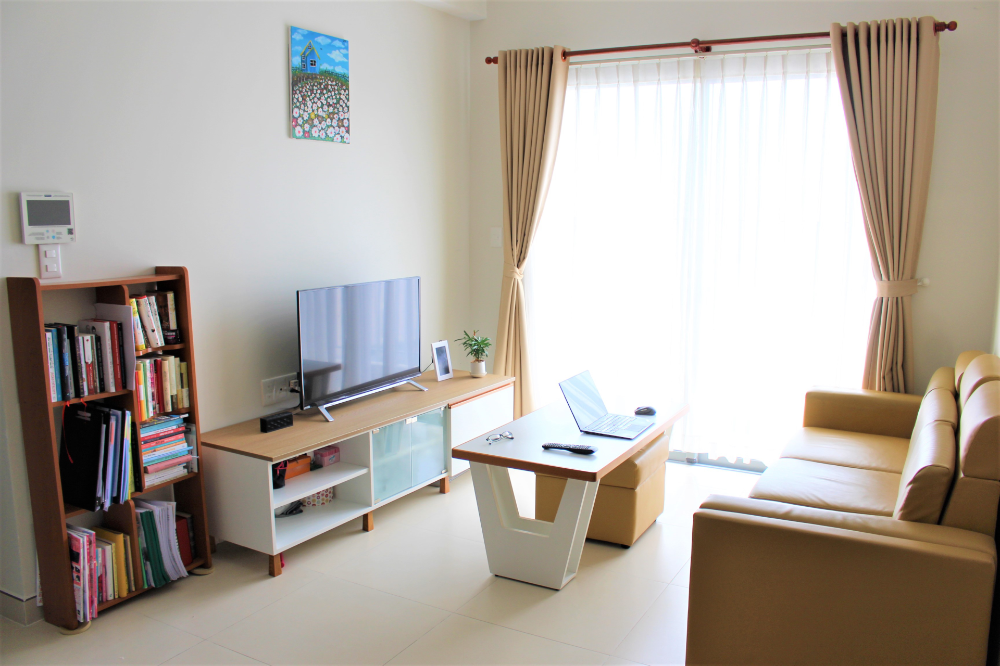

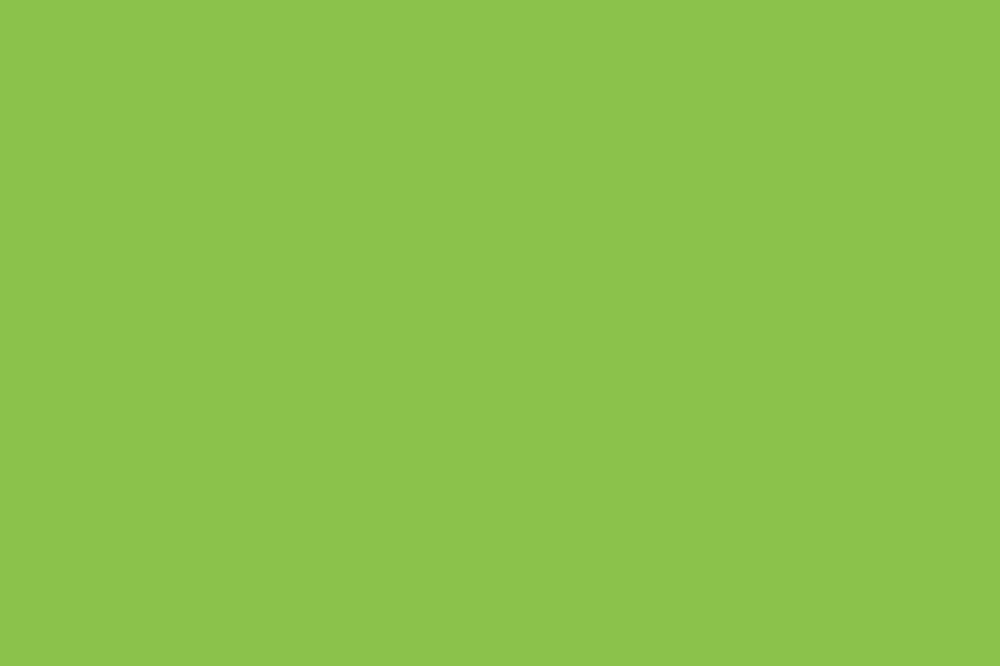

In [ ]:
from IPython.display import Image, display_png
display_png(Image('background.png'))
display_png(Image('greenback.png'))

# ■新たな背景と合成

In [ ]:
from PIL import Image

# 切り抜き画像
img = Image.open('cutout.png').convert('RGBA')

# 背景画像
bg = Image.open('background.png').convert('RGBA')

# 画像合成
img_clear = Image.new("RGBA", bg.size, (255, 255, 255, 0))
img_clear.paste(img, (100,230))
bg = Image.alpha_composite(bg, img_clear)

# 画像保存
bg.save('merge1.png')

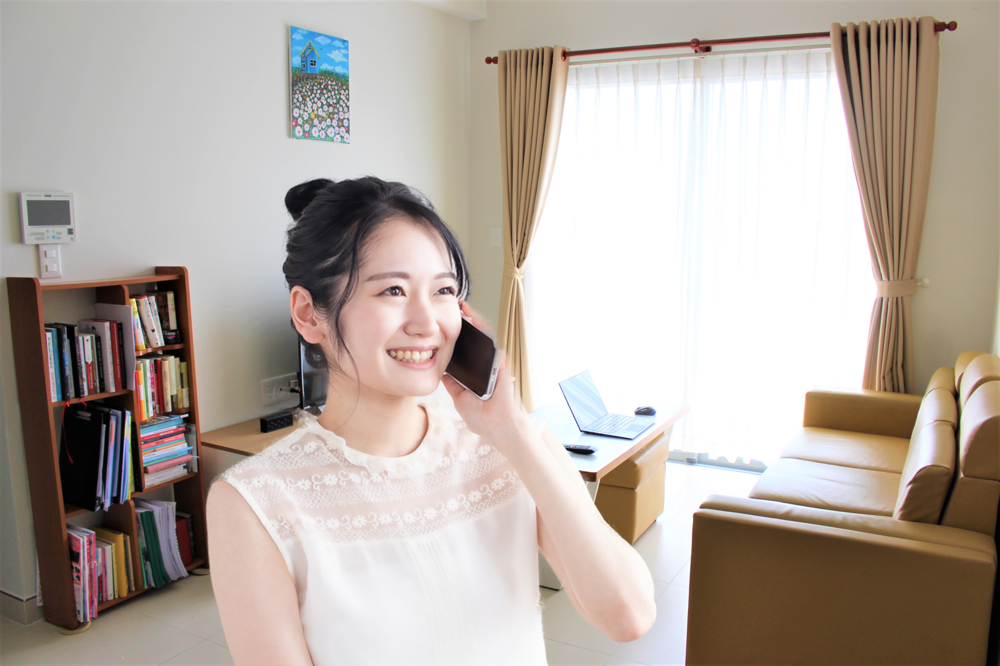

In [ ]:
from IPython.display import Image, display_png
display_png(Image('merge1.png'))

# ■Greenbackと合成

In [ ]:
from PIL import Image

# 切り抜き画像
img = Image.open('cutout.png').convert('RGBA')

# 背景画像
bg = Image.open('greenback.png').convert('RGBA')

# 画像合成
img_clear = Image.new("RGBA", bg.size, (255, 255, 255, 0))
img_clear.paste(img, (200,250))
bg = Image.alpha_composite(bg, img_clear)

# 画像保存
bg.save('merge2.png')

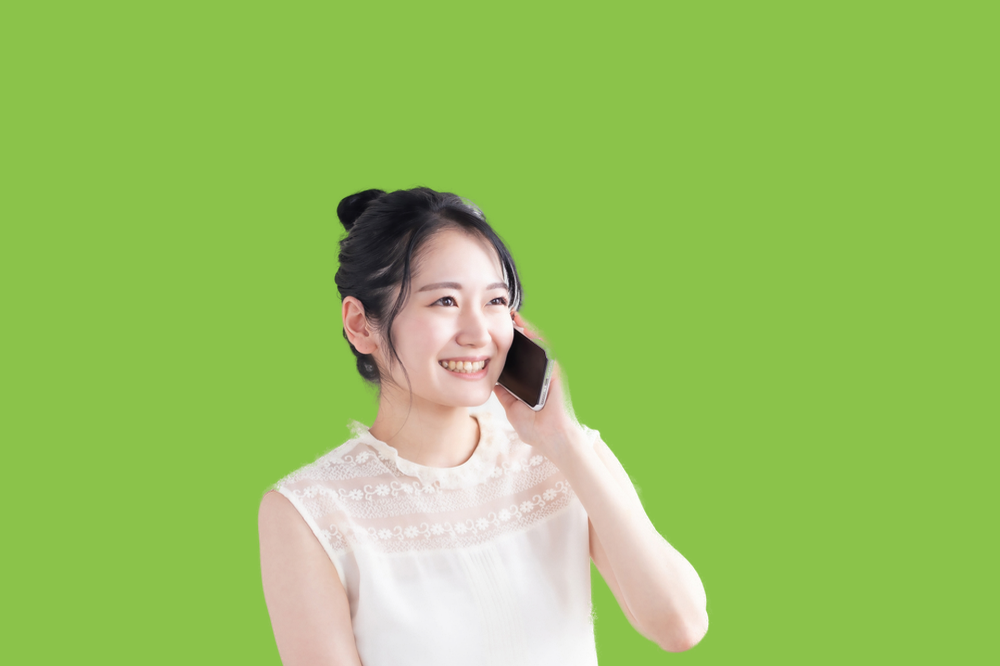

In [ ]:
from IPython.display import Image, display_png
display_png(Image('merge2.png'))